Importing packages

In [8]:
import gensim
from gensim.corpora import Dictionary
from gensim.models import LdaModel, CoherenceModel
from sklearn.model_selection import train_test_split
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import json
from pathlib import Path
from collections import defaultdict, Counter
import math
import numpy as np
import spacy
from spacy.lang.hu.stop_words import STOP_WORDS
from spacy.lang.hu import Hungarian
nlp=Hungarian()

Downloading and loading Hungarian Stop Word and Lemmatizer dictionary

In [9]:
hu = spacy.load('hu_core_news_lg')
stopwords = hu.Defaults.stop_words

Loading scraped article data from json file

In [11]:
f = open('../data/article_data.json', encoding="utf8")
article_data = json.load(f)

Function of text preprocessing (tokenization, filtering out stop words, and lemmatization)

In [14]:
def preprocess(word_list):
    result = []
    for token in word_list:
        token=token.lemma_
        if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 3 and token not in stopwords:
            result.append(token)
    return result

Grouping tokenized texts by topic (tag)

In [15]:
topic_docs = defaultdict(list)
for doc in article_data:
    if doc['tags']:  # Ensuring tag exists
        text = preprocess(hu(doc['article_text']))
        for tag in doc['tags']:
            topic_docs[tag].append(text)

Running LDA subtopic modeling analysis for each topic and storing them for later classification

In [16]:
lda_models = {}
dictionaries = {}

for topic, docs in topic_docs.items():
    if len(docs) < 2:
        continue  # Not enough data for LDA

    # Preparing corpus
    dictionary = Dictionary(docs)
    corpus = [dictionary.doc2bow(doc) for doc in docs]

    # Training LDA
    num_topics = 6
    lda = LdaModel(corpus, num_topics=num_topics, id2word=dictionary, passes=10, random_state=42)
    
    # Storing model and dictionary for later classification
    lda_models[topic] = lda
    dictionaries[topic] = dictionary

Creating Subtopic Classification, with counting articles and aggregating facebook activity

In [17]:
subtopic_counts = defaultdict(lambda: Counter())
subtopic_fb_activity = defaultdict(lambda: defaultdict(int))

for article in article_data:
    if article['tags']:
        tokens = preprocess(hu(article['article_text']))
        for topic in article['tags']:  # Looping through all tags
            if topic in lda_models:
                dictionary = dictionaries[topic]
                bow = dictionary.doc2bow(tokens)
                subtopic, _ = max(lda_models[topic][bow], key=lambda x: x[1])
                subtopic_counts[topic][subtopic] += 1
                # Summing up facebook activity (safely handling non-int)
                try:
                    subtopic_fb_activity[topic][subtopic] += int(article['facebook_activity'])
                except ValueError:
                    pass

Helper function for generating the colors of the word clouds

In [18]:
def fixed_color_func(color):
    def color_func(*args, **kwargs):
        return color
    return color_func

colors = ['#FFA500', '#A9A9A9', '#FF6347', '#1E90FF', '#FF66CC', '#3CB371']

Displaying word clouds with article classification for each topic, the subtopics sorted by facebook activity

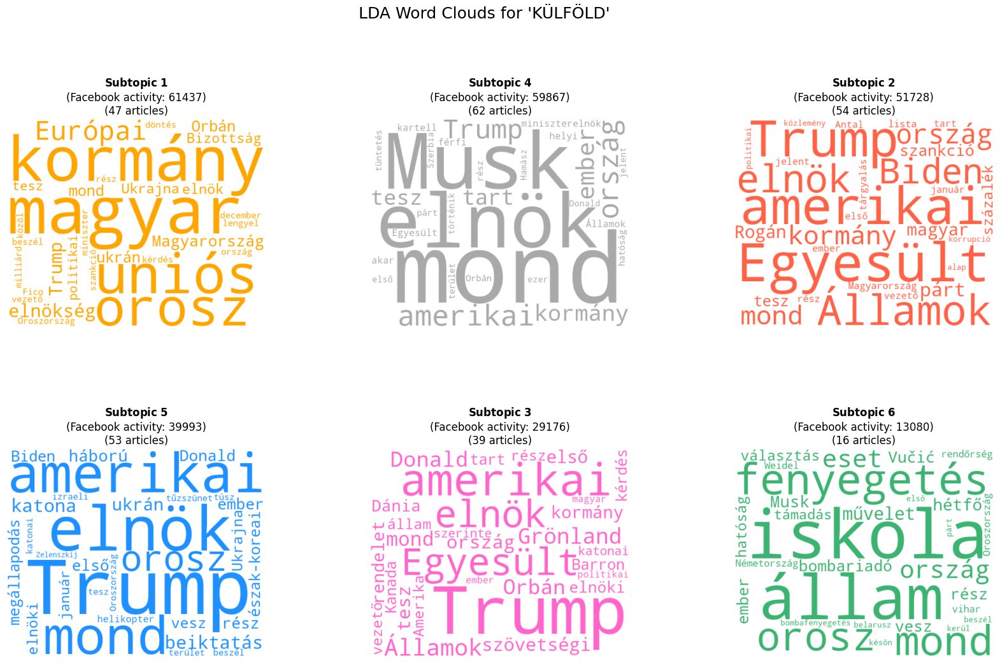

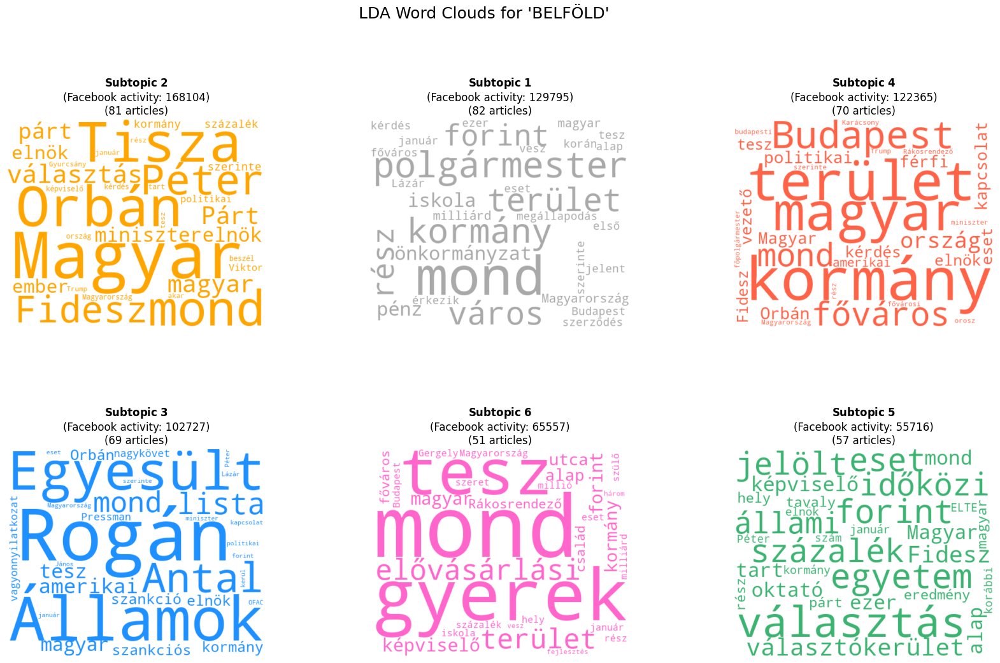

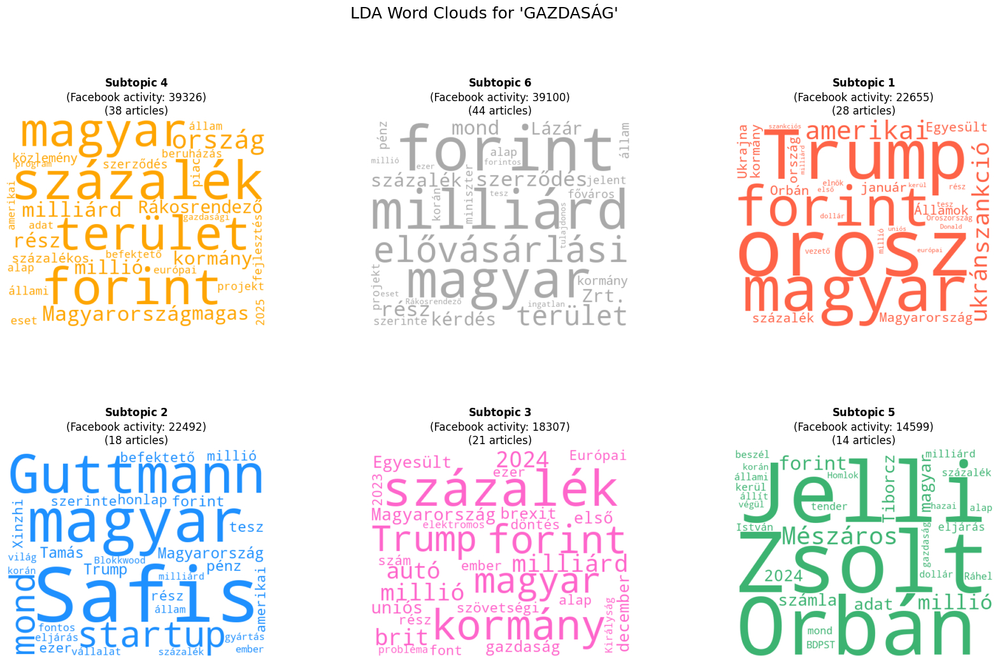

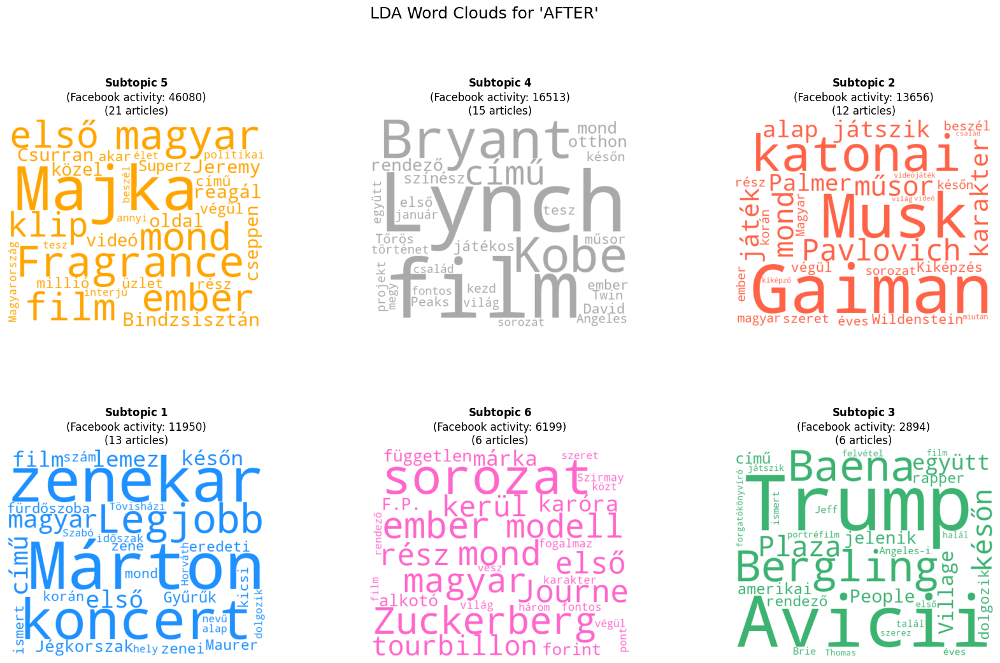

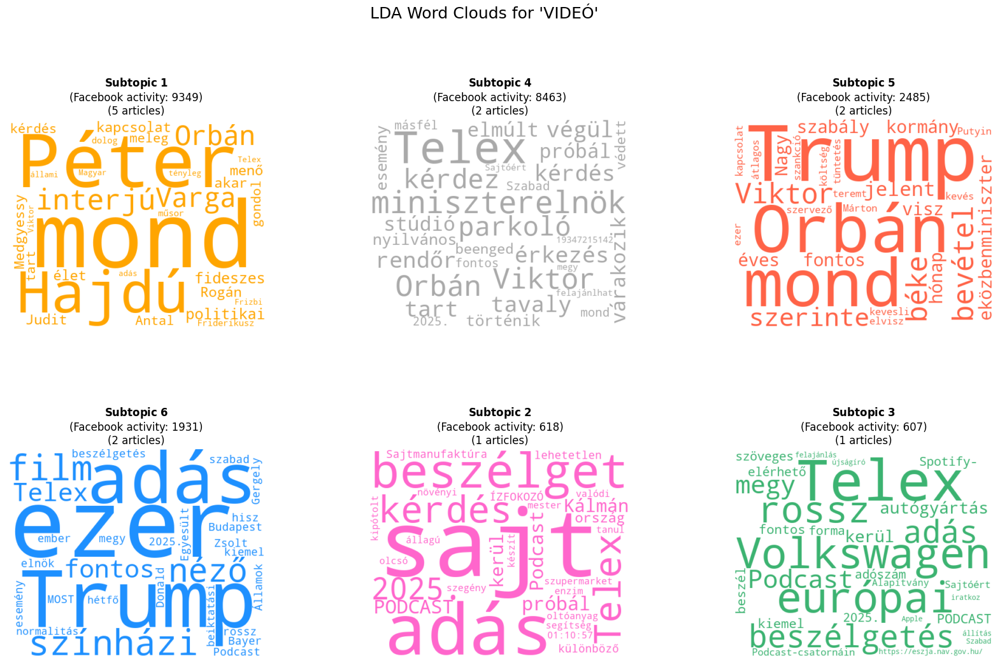

...

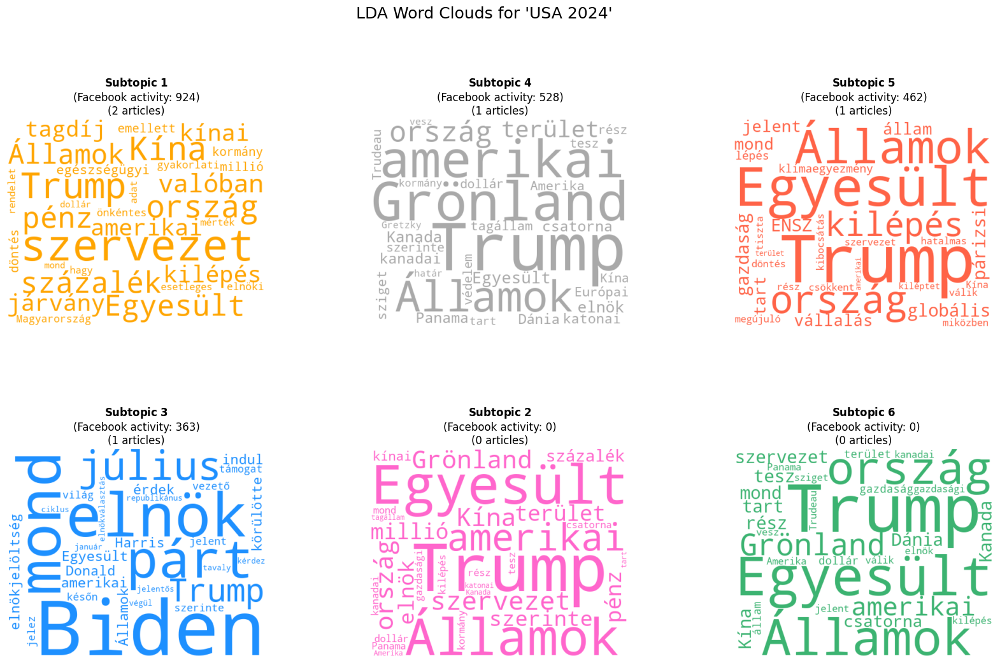

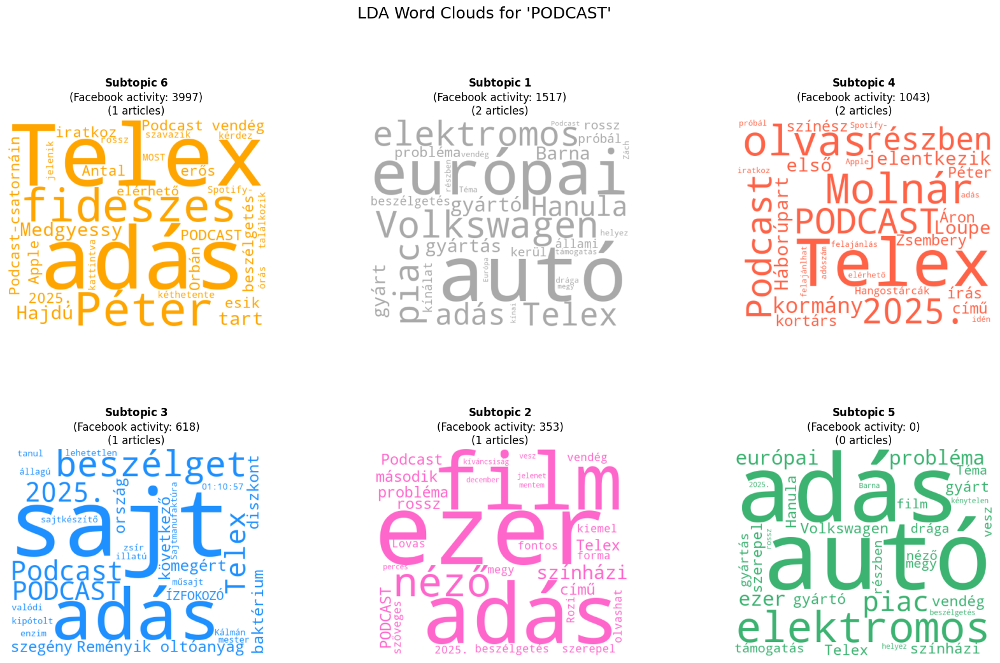

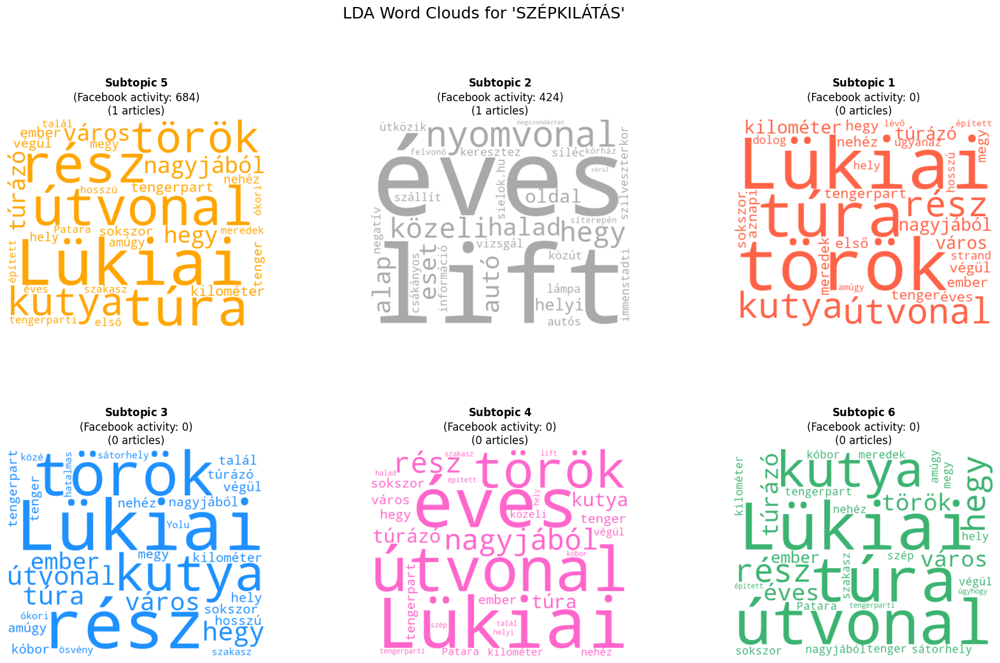

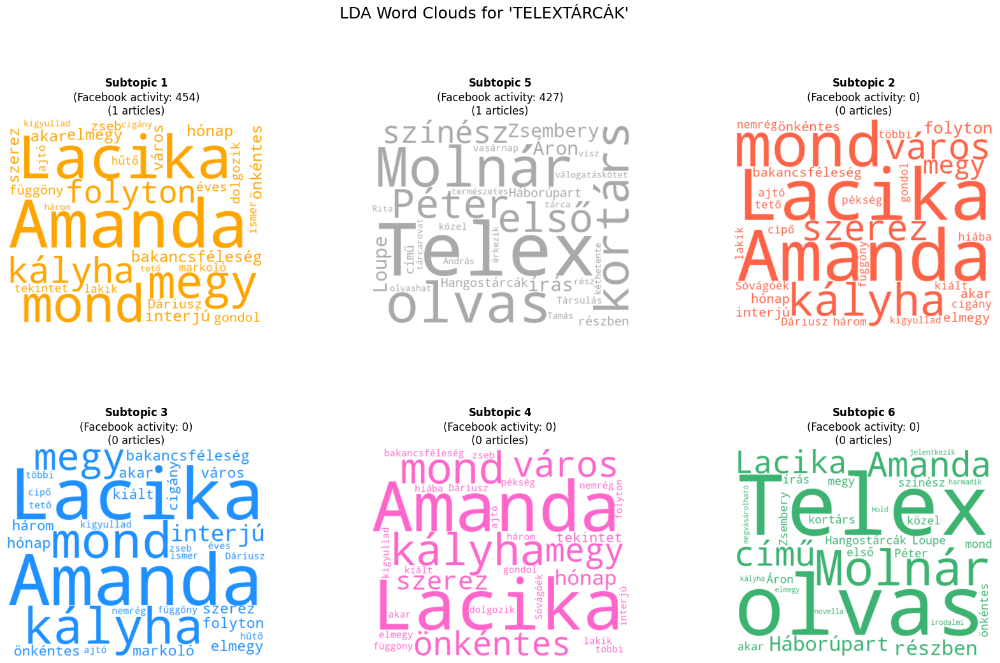

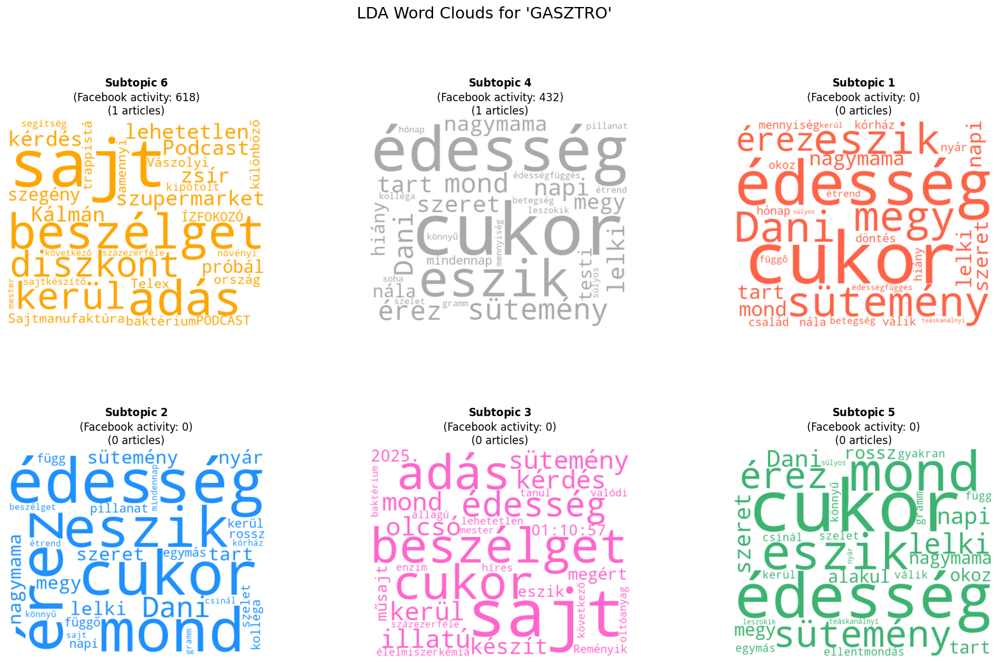

In [19]:
for topic, lda in lda_models.items():
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    fig.suptitle(f"LDA Word Clouds for '{topic}'", fontsize=18, y=0.98)
    axes = axes.flatten()
    
    sorted_subtopics = sorted(range(6), key=lambda i: subtopic_fb_activity[topic][i], reverse=True)
    
    for idx, i in enumerate(sorted_subtopics):
        terms = lda.show_topic(i, topn=30)
        word_freq = {term: weight for term, weight in terms}
        color_func = fixed_color_func(colors[idx % len(colors)])
        wc = WordCloud(width=500, height=400, background_color='white', color_func=color_func).generate_from_frequencies(word_freq)
        
        axes[idx].imshow(wc, interpolation='bilinear')
        title_text = (rf"$\bf{{Subtopic\ {i+1}}}$" f"\n(Facebook activity: {subtopic_fb_activity[topic][i]})" f"\n({subtopic_counts[topic][i]} articles)")
        axes[idx].set_title(title_text, fontsize=12, fontweight='normal', multialignment='center')
        axes[idx].axis('off')
    
    plt.subplots_adjust(wspace=0.4, hspace=0.4, top=0.85)
    plt.show()

Evaluating model performance through Coherence and Perplexity metrics

Creating training and test datasets, training the model for each topic

In [20]:
lda_models_eva = {}
dictionaries_eva = {}
test_corpus_eva = {}
docs_eva = {}

for topic, docs in topic_docs.items():
    if len(docs) < 2:
        continue  # Not enough data for LDA

    # Preparing corpus
    dictionary = Dictionary(docs)
    corpus = [dictionary.doc2bow(doc) for doc in docs]

    # Train/Test Splitting
    train_corpus, test_corpus = train_test_split(corpus, test_size=0.3, random_state=42)

    # Training LDA Model for Performance Evaluation
    num_topics = 6
    lda = LdaModel(train_corpus, num_topics=num_topics, id2word=dictionary, passes=10, random_state=42)

    # Storing model, dictionary, test corpus, and tokenized text for performance evaluation
    lda_models_eva[topic] = lda
    dictionaries_eva[topic] = dictionary
    test_corpus_eva[topic] = test_corpus
    docs_eva[topic] = docs

Perplexity for each topic

In [23]:
topics = []
perplexities = []
for topic, lda in lda_models_eva.items():
    test_corpus = test_corpus_eva[topic]    

    # Computing Perplexity
    print(f"\nPerplexity for '{topic}': ", lda.log_perplexity(test_corpus))
    
    topics.append(topic)
    perplexities.append(lda.log_perplexity(test_corpus))


Perplexity for 'KÜLFÖLD':  -10.794269231628709

Perplexity for 'BELFÖLD':  -10.877380632985838

Perplexity for 'GAZDASÁG':  -11.402618450190426

Perplexity for 'AFTER':  -12.486299030314711

Perplexity for 'VIDEÓ':  -11.167290478320474

Perplexity for 'TECHTUD':  -11.89668428147452

Perplexity for 'KULT':  -16.650299485235127

Perplexity for 'FOTÓ':  -12.295136412097841

Perplexity for 'ÉLETMÓD':  -12.378443398547065

Perplexity for 'ZACC':  -14.081140766929297

Perplexity for 'VÉLEMÉNY':  -12.026618167382328

Perplexity for 'SPORT':  -13.763630604670748

Perplexity for 'INTERJÚ':  -11.987323830034299

Perplexity for 'VÁLASZTÁSI FÖLDRAJZ':  -10.596993489745342

Perplexity for 'ÉSZKOMBÁJN':  -11.694435021327092

Perplexity for 'ELLENŐRZŐ':  -11.220800292160776

Perplexity for 'USA 2024':  -29.532974767255354

Perplexity for 'PODCAST':  -11.544290778771886

Perplexity for 'SZÉPKILÁTÁS':  -11.393095023906863

Perplexity for 'TELEXTÁRCÁK':  -10.726668523362845

Perplexity for 'GASZTRO':  

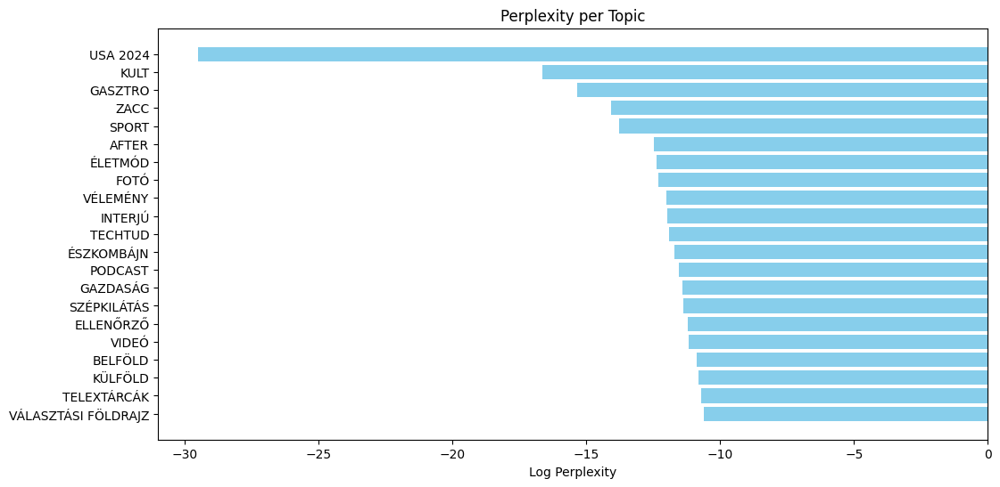

In [ ]:
# Sorting topics and perplexities based on perplexity values
topics_perplexities = list(zip(topics, perplexities))
topics_perplexities_sorted = sorted(topics_perplexities, key=lambda x: x[1], reverse=False)
sorted_topics, sorted_perplexities = zip(*topics_perplexities_sorted)

# Plotting results
plt.figure(figsize=(12, 6))
plt.barh(sorted_topics, sorted_perplexities, color='skyblue')
plt.xlabel('Log Perplexity')
plt.title('Perplexity per Topic')
plt.gca().invert_yaxis()
plt.show()

Perplexity measures how well the model predicts a sample. When looking at log perplexity, the lower (more negative) the metric is, the better the LDA topic modeling performed. Overall, the model performed quite well for all topics since all have more than -10 log perplexities.

When comparing each topic, the best performing one is "USA 2024" with a -29.53 metric, meaning the model predicts this topic's texts very well.While the worst performing one is "VÁLASZTÁSI FÖLDRAJZ" with a -10.6 log perplexity, meaning the model struggles the most here.

However, these differences could originate from difference in the consistency of the vocabulary, the diversity of the language, or the volume of the data.

Coherence Score for each topic

In [30]:
topics = []
coherences = []

for topic, lda in lda_models_eva.items():
    docs = docs_eva[topic]
    dictionary = dictionaries_eva[topic]

    # Computing Coherence Score
    coherence_model_lda = CoherenceModel(model=lda, texts=docs, dictionary=dictionary, coherence='c_v')
    coherence_lda = coherence_model_lda.get_coherence()
    print(f"\nCoherence Score for '{topic}': ", coherence_lda)
    
    topics.append(topic)
    coherences.append(coherence_lda)


Coherence Score for 'KÜLFÖLD':  0.35174558291105934

Coherence Score for 'BELFÖLD':  0.4686889655529804

Coherence Score for 'GAZDASÁG':  0.3385219760065404

Coherence Score for 'AFTER':  0.3552722648003554

Coherence Score for 'VIDEÓ':  0.586635890116526

Coherence Score for 'TECHTUD':  0.36904594875082153

Coherence Score for 'KULT':  0.43684068742354376

Coherence Score for 'FOTÓ':  0.5047946247861491

Coherence Score for 'ÉLETMÓD':  0.4946906000600557

Coherence Score for 'ZACC':  0.3955827780308054

Coherence Score for 'VÉLEMÉNY':  0.5583717969904944

Coherence Score for 'SPORT':  0.40062308327934243

Coherence Score for 'INTERJÚ':  0.4277617126534386

Coherence Score for 'VÁLASZTÁSI FÖLDRAJZ':  0.45988151510528014

Coherence Score for 'ÉSZKOMBÁJN':  0.7033997811644328

Coherence Score for 'ELLENŐRZŐ':  0.46663064431498563

Coherence Score for 'USA 2024':  0.2829195731373277

Coherence Score for 'PODCAST':  0.4039510691146681

Coherence Score for 'SZÉPKILÁTÁS':  0.916207720017036

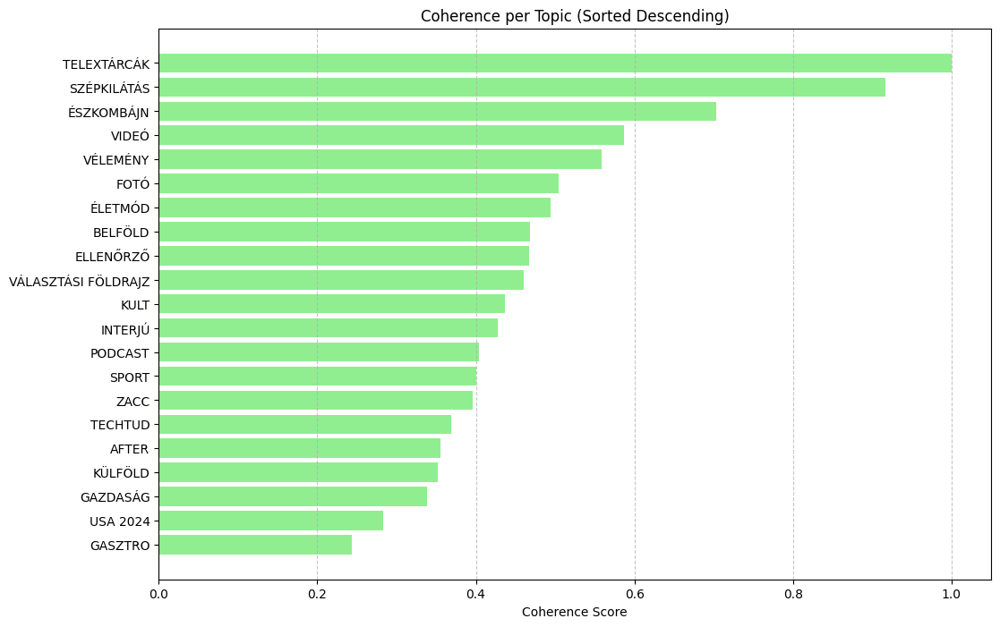

In [31]:
# Sorting topics and coherences based on perplexity values
topics_coherence = list(zip(topics, coherences))
topics_coherence_sorted = sorted(topics_coherence, key=lambda x: x[1], reverse=True)
sorted_topics, sorted_coherence = zip(*topics_coherence_sorted)

# Plot
plt.figure(figsize=(12, 8))
plt.barh(sorted_topics, sorted_coherence, color='lightgreen')
plt.xlabel('Coherence Score')
plt.title('Coherence per Topic (Sorted Descending)')
plt.xlim(0, 1.05)
plt.gca().invert_yaxis()
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

Coherence measures semantic similarity between the top words in each topic. When looking at coherence, the higher (closer to 1) the metric is, the more sense words in the topic make to humans. Overall, the coherence of subtopics are quite good for some topics, while some have worse structure.

When comparing each topic, "TELEXTÁRCÁK" and "SZÉPKILÁTÁS" have the highest coeherence, meaning they are very clean and focused topics. While "USA 2024" and "GASZTRO" are the least cohesive topics, meaning they have a more poor word structure.



Possible solutions to less cohesive topics:
- Merginng weaker topics
- Changing the number of subtopics per topic

Topics can have better perplexity but worse coherence, meaning the model predicts well but the topic is messy for humans to interpret.

Perplexity focuses on good prediction (low log perplexity), while coherence on good human interpretability (high coherence).

Overall, the model achieves both reasonably well: predicts words precisely and has decent interpretability across topics.